# Exploration de données Data 4 Good

### Import des librairies

In [1]:
import pandas as pd
import plotly.express as px

### Chargement des données

In [2]:
df = pd.read_csv(r"C:\Users\straw\Desktop\AIS2\Data-4-Good\Data\p2-arbres-fr.csv", sep=";")
df.head()

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,20,5,NaN,0.0,48.857620,2.320962
1,99875,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,65,8,A,NaN,48.857656,2.321031
2,99876,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,90,10,A,NaN,48.857705,2.321061
3,99877,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,22,Erable,Acer,negundo,NaN,60,8,A,NaN,48.857722,2.321006
4,99878,Arbre,Jardin,PARIS 17E ARRDT,NaN,NaN,PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING,000G0037,Arbre à miel,Tetradium,daniellii,NaN,38,0,NaN,NaN,48.890435,2.315289


### Informations sur le jeu de données

Cette commande permet de visualiser plusieurs informations pertinentes sur notre jeu de données. En effet, il est possible de voir le nombre d'observations (**200137**), le nombre de variables, leur nom ainsi que leur type, la taille du fichier importé (**27.5+ MB**) et finalement, le nombre de données présentes par variable.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200137 entries, 0 to 200136
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   200137 non-null  int64  
 1   type_emplacement     200137 non-null  object 
 2   domanialite          200136 non-null  object 
 3   arrondissement       200137 non-null  object 
 4   complement_addresse  30902 non-null   object 
 5   numero               0 non-null       float64
 6   lieu                 200137 non-null  object 
 7   id_emplacement       200137 non-null  object 
 8   libelle_francais     198640 non-null  object 
 9   genre                200121 non-null  object 
 10  espece               198385 non-null  object 
 11  variete              36777 non-null   object 
 12  circonference_cm     200137 non-null  int64  
 13  hauteur_m            200137 non-null  int64  
 14  stade_developpement  132932 non-null  object 
 15  remarquable      

### Observations manquantes

La commande ci-dessous permet de voir le pourcentage de données manquantes par variable du jeu de données.

In [4]:
(df.isnull().sum()/200137)*100

id                       0.000000
type_emplacement         0.000000
domanialite              0.000500
arrondissement           0.000000
complement_addresse     84.559577
numero                 100.000000
lieu                     0.000000
id_emplacement           0.000000
libelle_francais         0.747988
genre                    0.007995
espece                   0.875400
variete                 81.624088
circonference_cm         0.000000
hauteur_m                0.000000
stade_developpement     33.579498
remarquable             31.527404
geo_point_2d_a           0.000000
geo_point_2d_b           0.000000
dtype: float64

In [5]:
df = df.drop(['numero', 'complement_addresse', 'variete', 'type_emplacement'], axis = 1)

Les colonnes(ou variables) **numero**, **complement_addresse** et **variete** ont été supprimées car elles ne présentent pas assez d'information. Par ailleurs, même si la variable **type_emplacement** n'a aucune donnée manquante, celle-ci n'ajoute rien à l'analyse car ne fait que répéter la même observation *arbre*.

--------------------------------------------------------------------

### Statistiques sur la hauteur et la circonférence des arbres

In [9]:
df.loc[:,["circonference_cm", "hauteur_m"]].describe()

,circonference_cm,hauteur_m
count,200137.000000,200137.000000
mean,83.380479,13.110509
std,673.190213,1971.217387
min,0.000000,0.000000
25%,30.000000,5.000000
50%,70.000000,8.000000
75%,115.000000,12.000000
max,250255.000000,881818.000000


### Proportion des types de domanialité

In [30]:
fig = px.histogram(df, x="domanialite")
fig.show()

### Proportion des stades de développement des arbres

In [39]:
fig = px.histogram(df, x="stade_developpement")
fig.show()

In [40]:
df.columns

Index(['id', 'domanialite', 'arrondissement', 'lieu', 'id_emplacement',
       'libelle_francais', 'genre', 'espece', 'circonference_cm', 'hauteur_m',
       'stade_developpement', 'remarquable', 'geo_point_2d_a',
       'geo_point_2d_b'],
      dtype='object')

<AxesSubplot:xlabel='geo_point_2d_a', ylabel='geo_point_2d_b'>

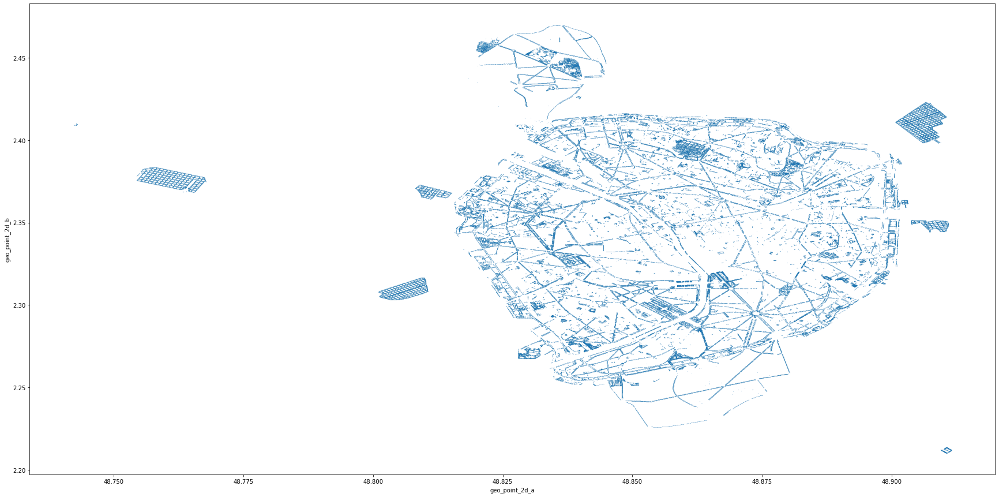

In [57]:
df.plot(x="geo_point_2d_a", y="geo_point_2d_b", kind="scatter", s=0.01, figsize=(30,15))